In [1]:
import glob
import re
import string
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from num2words import num2words
import math
from heapq import nlargest
 
import re
import string
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import matplotlib.pyplot as plt_tsne
import matplotlib.pyplot as plt_MAP
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt

In [2]:
 
    
 # Preprocessing and creating only tf containg index dictionary here. Mapping of every document name and id can be seen here.   
invIndex={}
length={}
df={}
global_doc=[]
templist=[]
globalmap=[] 

#gd_list={}

def preprocessing():
    counter=0
    
    folders = [i for i in glob.glob('20_newsgroups_assi4/*')]
    for j in folders:
        print(j)
        subfolders=glob.glob(j+'/*')
        #print(subfolders)
        for h in subfolders:
            
            templist=[]
            file=open(h)
            
            X=file.read()
            counter=counter+1
            global_doc.append(counter)
            print(h,"............................",counter)
            X =X.lower()
            
           
            
            
            translator=X.maketrans('','',string.punctuation)
            #translator=X.maketrans(string.punctuation,'                                ')
            
            X=X.translate(translator)
            #print(X)
            stop_words = set(stopwords.words('english'))
            tokens = word_tokenize(X)
            
            #tokens=list(set(tokens))

#             pattern='[0-9][a-z]|[0-9]'
#             tokens=[re.sub(pattern,'',j) for j in tokens]
            
            result = [i for i in tokens if not i in stop_words]
    #print (result)

            lemmatizer=WordNetLemmatizer()
            for word in result:
                word1=lemmatizer.lemmatize(word)
                if word1.isdecimal():
                    templist.append(num2words(word1))
                else:
                    templist.append(word1)
    
            templist1=list(set(templist))
            #print(templist[2])
            for w in templist1:
                if w in df:
                    df[w]=df[w]+1
                else:
                    df[w]=1
                    
                if w in invIndex:
                    invIndex[w][counter]=math.log(1+templist.count(w))/len(templist)
                    #gd_list[w][counter]=gd[str(counter)]
                    
                else:
                    invIndex[w]={}
                    invIndex[w][counter]=math.log(1+templist.count(w))/len(templist)
                    #gd_list[w]={}
                    #gd_list[w][counter]=gd[str(counter)]


            length[counter]=len(templist)        


preprocessing() 
print("pre processing completed")
#print(invIndex[2])
#print(global_doc)

20_newsgroups_assi4\comp.graphics
20_newsgroups_assi4\comp.graphics\37261 ............................ 1
20_newsgroups_assi4\comp.graphics\37913 ............................ 2
20_newsgroups_assi4\comp.graphics\37914 ............................ 3
20_newsgroups_assi4\comp.graphics\37915 ............................ 4
20_newsgroups_assi4\comp.graphics\37916 ............................ 5
20_newsgroups_assi4\comp.graphics\37917 ............................ 6
20_newsgroups_assi4\comp.graphics\37918 ............................ 7
20_newsgroups_assi4\comp.graphics\37919 ............................ 8
20_newsgroups_assi4\comp.graphics\37920 ............................ 9
20_newsgroups_assi4\comp.graphics\37921 ............................ 10
20_newsgroups_assi4\comp.graphics\37922 ............................ 11
20_newsgroups_assi4\comp.graphics\37923 ............................ 12
20_newsgroups_assi4\comp.graphics\37924 ............................ 13
20_newsgroups_assi4\comp.graphics\37925

In [3]:
# Calculating idf

idf={}
for z in df.keys():
    idf[z]=math.log((len(global_doc))/(df[z]+1))
    #idf[z]=len(global_doc)/(1+df[z])

#print(idf["subject"])
print(len(idf))
print(len(invIndex))


-0.00019998000266624517
83800
83800


In [ ]:
# negative2=[]
# for j in idf:
#     if(idf[j]<0):
#            idf[j]=0

In [5]:
#storing tfidf in a dic to calculate cosine similarity 
dic_tfidf={}
for term in invIndex.keys():
    for doc2 in invIndex[term]: 
        if term in dic_tfidf.keys():
                    dic_tfidf[term][doc2]=idf[term]*invIndex[term][doc2]
                   
                    
        else:
            dic_tfidf[term]={}
            dic_tfidf[term][doc2]=idf[term]*invIndex[term][doc2]
                   
print(len(dic_tfidf))
print(dic_tfidf['gnuplot'])

83800
{2: 0.055778867564499034, 215: 0.001581881698455336, 246: 0.03281109856735237, 289: 0.032571601497517685, 617: 0.0011985789430996301, 691: 0.0015744864367305894, 983: 0.058330841897515334}


In [6]:
# negative=[]
# for j in dic_tfidf:
#     for docc in dic_tfidf[j]:
#         if(dic_tfidf[j][docc]<0):
#             X=dic_tfidf[j][docc]
#             #print(X)
#             print(j)
#             negative.append(X)
# print(len(negative))

In [7]:

#create query vector 

vec_query=[]
#querylist=['enzyme', 'replacement', 'therapy']
def query_vectorize(querylist):
    vec_query.clear()
    print("query made vector")
    print(querylist)
    #querylist=["enzyme","replacement","therapy"]
    for vocab in dic_tfidf:

        if vocab in querylist:

           
            count=math.log(1+querylist.count(vocab))/len(querylist)
                    #y=Num_docs/(idf[q]+1)       #Num_docs/log(idf[lem_word]+1) :idf formula used
            cos_idf=idf[vocab]                            #Num_docs/log(df+1) :idf formula usedcos_idf=math.log(y,10)

            vec_query.append(count*cos_idf)


        else:
            vec_query.append(0)


In [8]:
#non zero val in query vector
for po in vec_query:
    if po!=0:
        print(po)

In [9]:
#create doc vector
vec_doc={}
val_list=[]
for doc3 in global_doc:
    val_list=[]
    for term2 in dic_tfidf:
        if doc3 in dic_tfidf[term2]:
            print(doc3)
            #print(term2)
            val_list.append(dic_tfidf[term2][doc3])
            
            
        else:
            val_list.append(0)
    vec_doc[doc3]=val_list
print(len(vec_doc))
  
    

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5


In [ ]:
# import pickle                            #Dictionary tried to save above result but was giving wrong random results
# pickle_o= open('IR4_docvec', 'wb')       #hence not done
# pickle.dump(vec_doc, pickle_o)
# pickle_o.close()

In [ ]:
# import pickle

# pickle_i=open('IR4_docvec', 'rb') 
# vec_doc = pickle.load(pickle_i)

In [10]:



def prec_recall(e):
   
    map1=0
    prec_list=[]
    recall_list=[]
    prec_list.clear()
    recall_list.clear()
    counter=0
    prec=0
    recall=0
    rel=0
    for ret_doc in cos_result:
        
        counter+=1
        if ret_doc in ground_t:
            
            rel=rel+1
            map1=map1+(rel/counter)
            #print("rel",rel)
        prec=rel/counter
        prec_list.append(prec)
        recall=rel/1000 
        recall_list.append(recall)
    map1=map1/rel
    map_list.append(map1)
    
   #print(prec_list)
    #rint(recall_list)
    #import matplotlib.pyplot as plt 
    
    plt.plot(recall_list, prec_list,label=str(e+1)+"nd iteration")
    
    #plt.show()
    #print(value2[1])
    
#     prec=rel_docs/counter
#     prec_list.append(prec)

In [11]:
# rel_doc=[]
# nonrel_doc=[]

def cosine_similarity(vec_query,k):
    #cos_query={}
    #cos_doc={}
    #cos_result={}
    cos_score={}
    Num=0
    Q_Denom=0
    D_Denom=0
    print("Calculating Cosine Similarity")
    #print(len(vec_query))
    #print(vec_query)
    
    #cos_query1={}
    #print(querylist)
    for d in tempdoc:
        
        #print(d)
        Num=0
        Q_Denom=0
        D_Denom=0
        for qu in range(len(dic_tfidf)):
            Num +=vec_query[qu]*vec_doc[d][qu]
            Q_Denom +=vec_query[qu]*vec_query[qu]
            D_Denom +=vec_doc[d][qu]*vec_doc[d][qu]
        Q_Denom=math.sqrt(Q_Denom)
        D_Denom=math.sqrt(D_Denom)
        N = Num/(1+(Q_Denom*D_Denom))
        
        cos_score[d]=N
        
   
    
      
    kHighest=[]
    kHighest = nlargest(k,cos_score,key = cos_score.get)
    cos_result.clear() 
    
    for val in kHighest:
        cos_result[val]=cos_score.get(val)
        #cos_list.append(cos_result)
        if (val in rel_doc):
            print(val, "*:", cos_score.get(val))
        else:
            print(val, ":", cos_score.get(val))
    
    
   
   
        
        


In [12]:

def take_feedback(k):
#     print(" enter number of relevant document")
#     choice=int(input())
    #global_rel=[]
    #rel_doc=[]
    choice=int(k*0.1)                           #p is kept as 10% of retrieved docs
    nonrel_doc.clear()
    
    print("Enter Relevant Docs ")
    
    for doc3 in cos_result:
        if(choice==0):
            break
        if doc3 in ground_t:
            if doc3  not in rel_doc:
                rel_doc.append(doc3)
                choice=choice-1
    print("global rel doc.........",rel_doc)
        
            #global_rel_doc.append(r_doc)
    for n in cos_result:                   #top k docs of cosine are present in c
        if n not in rel_doc: 
            nonrel_doc.append(n)
    #print( "rel docs",rel_doc)
    print("non_rel docs..........................................................",len(nonrel_doc))
        
   
        

In [13]:
#TSNE plot code for query and the docs 2D
def gen_tsne(rel, nonrel, Q_m,s):
    tsne = TSNE(n_components=2, random_state=0)

    feature_vector = []
    labels1 = []

    for i in rel:
        feature_vector.append(vec_doc[i])
        labels1.append(0)
    for i in nonrel:
        feature_vector.append(vec_doc[i])
        labels1.append(1)

    feature_vector.append(Q_m)
    labels1.append(2)

    transformed_data = tsne.fit_transform(np.array(feature_vector))
    k = np.array(transformed_data)
    t = ("Relevant", "Non Relevant", "Query")
    plt_tsne.scatter(k[:, 0], k[:, 1], c=labels1, s=60, alpha=0.8, label="Violet-R, Aqua-NR")
    plt_tsne.title("Rocchio Algorithm"+str(s+1)+"nd iteration")
    plt_tsne.legend()
    plt_tsne.grid(True)
    plt_tsne.show()
    print("TSNE..........................................................................")
        

In [14]:

def make_ground_truth(fol):
    ground_t.clear()
    X=0
    if (fol==1):
        X=1
        for val in range(1000):
            ground_t.append(X)
            X=X+1
        
    elif (fol==2) :
        X=1001
        for val in range(1000):
            ground_t.append(X)
            X=X+1  
    elif (fol==3) :
        X=2001
        for val in range(1000):
            ground_t.append(X)
            X=X+1 
    elif (fol==4):
        X=3001
        for val in range(1000):
            ground_t.append(X)
            X=X+1
    elif (fol==5):
        X=4001
        for val in range(1000):
            ground_t.append(X)
            X=X+1
    else:
        print("enter valid nuumber from 1 to 5")
    #print(ground_t)
    #print(len(ground_t))

In [15]:
def rocchio_algo(s,k):
    new_query_vec=[]
    new_rel_doc=[]
    Q_r=[]
    Q_nr=[]
    S=0
    E=0
    chosen_rel=int(k*0.1)  
    rel_doc_vec=[]
    non_rel_doc_vec=[]
    for i in range(len(dic_tfidf)):
        rel_doc_vec.append(0)
    
    S=int(s*chosen_rel)
    E=int(S+chosen_rel)
    #print("S",S)
    #print("E",E)
    new_rel_doc=rel_doc[S:E]
    print("new  rel Doc................... in rochio",new_rel_doc)
    for rdoc in new_rel_doc:
        
        for t in range(len(vec_doc)):
            rel_doc_vec[t]+=vec_doc[rdoc][t]
    #print(len(rel_doc_vec))
    #print(rel_doc_vec)
    
    for j in range(len(dic_tfidf)):
        non_rel_doc_vec.append(0)
    for nrdoc in nonrel_doc:
        for ti in range(len(vec_doc)):
            
            non_rel_doc_vec[ti]+=vec_doc[nrdoc][ti]
    #print(".........................................",len(non_rel_doc_vec))
    #print("......................................",non_rel_doc_vec)
    Alpha=[]
    Beta=[]
    Gama=[]
    #Alpha=vec_query
    for z in range(len(dic_tfidf)):
        Alpha.append(0)
    for tp in range(len(Alpha)):
        Alpha[tp]=vec_query[tp]

    for ip in range(len(dic_tfidf)):
        Beta.append(0)
    for ta in range(len(Beta)):
        Beta[ta]=0.75*rel_doc_vec[ta]
        #print("BETA",Beta)
    for g in range(len(dic_tfidf)):
        Gama.append(0)
    for b in range(len(Gama)):
        Gama[b]=0.25*non_rel_doc_vec[b]
        #print("GAma",Gama)
    
    
    for m in  range(len(dic_tfidf)):
        vec_query[m]=Alpha[m]+Beta[m]/len(new_rel_doc)-Gama[m]/len(nonrel_doc)
    for z in range(len(dic_tfidf)):
        if (vec_query[z]<0):
            vec_query[z]=0
    print(len(vec_query))
    print(".............in rochio")
    gen_tsne(new_rel_doc,nonrel_doc,vec_query,s)
    for n in range(len(dic_tfidf)):
        new_query_vec.append(vec_query[n])
    updated_q_list.append(new_query_vec)
    #print("new query.................",new_query_vec)
    #print("updated  list.................",updated_q_list)
            #print("Done positive")
    #print("_____________________________________________________________________________________________________________")
    #print(vec_query)
#     if(Alpha== vec_query):
#         print("True")
#     else:
#         print("False")
    
        #print(vec_query)
    #cosine_similarity(vec_query,k)
    #gen_tsne(Q_r, Q_nr,new_query_vec)
    cosine_similarity(vec_query,k)



In [16]:
#Global variables


cos_result={}
kHighest=[]
#global_rel_doc=[]
rel_doc=[]
rel_doc=[]
nonrel_doc=[]
ground_t=[]
updated_q_list=[]

map_list=[]
        


print("Enter Query :")
query=input()
print("Select the Folder number for ground Truth:")
print("1.com.graphics 2.rec.sport.hockey 3.sci.med  4.sci.space  5.talk.politics.misc")
fol=int(input()) 
make_ground_truth(fol)
#query_list=[]

rel_doc=[]  
non_rel_doc=[]
query=query.lower()
#translator=query.maketrans(string.punctuation,'                                ')
query=query.translate(str.maketrans("","",string.punctuation))
#query=query.translate(translator)
stop_words = set(stopwords.words('english'))
query = word_tokenize(query)
query=list(query)
result = [i for i in query if not i in stop_words]
querylist=[]
lemmatizer=WordNetLemmatizer()
for word in result:
    if word.isdecimal()==True:
        word=num2words(word)
    querylist.append(lemmatizer.lemmatize(word))
#print(querylist)
tempdoc=[]
for word in querylist:
    for doc4 in dic_tfidf[word]:
        if doc4 not in tempdoc:
            tempdoc.append(doc4)
query_vectorize(querylist)
updated_q_list.append(vec_query)
#print(len(vec_query))
# query_vectorize(querylist)
# #print(len(vec_query))
print("Number of documents to retrive")
k=int(input()) 
print("Fetching  Top ",k,"docs for you...................")
cosine_similarity(vec_query,k)       


Enter Query :
Pretty good opinions on biochemistry machines
Select the Folder number for ground Truth:
1.com.graphics 2.rec.sport.hockey 3.sci.med  4.sci.space  5.talk.politics.misc
3
query made vector
['pretty', 'good', 'opinion', 'biochemistry', 'machine']
Number of documents to retrive
100
Fetching  Top  100 docs for you...................
Calculating Cosine Similarity
362 : 0.04829768554076634
2041 : 0.036645710171460136
436 : 0.03641425828607522
613 : 0.026849403822926665
676 : 0.024164130344563054
2754 : 0.020862779244777967
2478 : 0.020775029870261027
2761 : 0.019987994925028448
2350 : 0.018502957499136313
2422 : 0.017755064051673906
2865 : 0.017276249527719122
1278 : 0.01603271595921565
2164 : 0.01599332545864797
2176 : 0.01588235965910201
2479 : 0.015501568919442942
80 : 0.015015138934149769
798 : 0.014447821927256485
1104 : 0.01416707537104527
377 : 0.01415222820903156
2662 : 0.013952700637495631
488 : 0.01374246179807062
569 : 0.013160957341361825
598 : 0.012628077645001007


In [ ]:
#prec_recall()

#### print(cos_result)

In [ ]:
# take_feedback()
# rocchio_algo()
# prec_recall()

Iteration 1
['pretty', 'good', 'opinion', 'biochemistry', 'machine']
Enter Relevant Docs 
global rel doc......... [2041, 2754, 2478, 2761, 2350, 2422, 2865, 2164, 2176, 2479]
non_rel docs.......................................................... 90
new  rel Doc................... in rochio [2041, 2754, 2478, 2761, 2350, 2422, 2865, 2164, 2176, 2479]
83800
.............in rochio


<IPython.core.display.Javascript object>


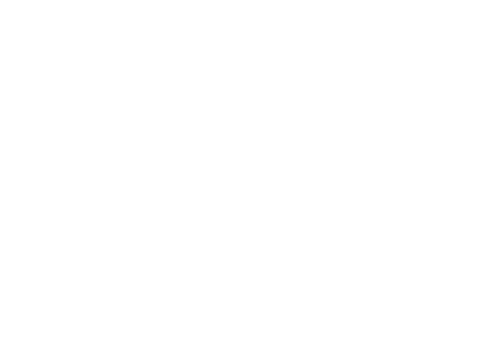

TSNE..........................................................................
Calculating Cosine Similarity


In [ ]:
         # Feedback given for 3 iteration
for i in range(3):
    print("Iteration",(i+1))
    print(querylist)
    take_feedback(k)
    rocchio_algo(i,k)
    prec_recall(i)
    
globalmap.append(map_list)
print("global_map_list..................",globalmap)

plt.xlabel('Recall') 
plt.ylabel('Precision') 
plt.title('Precision-Recall Graph')
plt.legend()
plt.show()



# for i in range(3):
#     take_feedback()
#     rocchio_algo()
#     prec_recall()
# plt.legend()
# plt.show()


In [ ]:
print(len(cos_result))

In [17]:
%matplotlib notebook
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt2
label=['Initial query','Query-1','Query-2','Query-3','Query-4']
X=np.array(updated_q_list)
print(X.shape)
model = TSNE(n_components=2, random_state=23, perplexity=40,n_iter=2500)
transformed_X = model.fit_transform(X)
print("Xafter:",transformed_X.shape)
k=0
for i in transformed_X:
    
    plt2.scatter(i[0],i[1],cmap='rainbow')
    
    plt2.annotate(label[k], (i[0], i[1]))
    k=k+1

(1, 83800)


ValueError: Found array with 1 sample(s) (shape=(1, 83800)) while a minimum of 2 is required.

In [ ]:
# def gen_tsne(Q_r, Q_nr, Q_m):
#     tsne = TSNE(n_components=2, random_state=0)

#     feature_vector = []
#     labels = []

#     for i in Q_r:
#         feature_vector.append(vec_doc[i])
#         labels.append(0)
#     for i in Q_nr:
#         feature_vector.append(vec_doc[i])
#         labels.append(1)

#     feature_vector.append(Q_m)
#     labels.append(2)

#     transformed_data = tsne.fit_transform(np.array(feature_vector))
#     k = np.array(transformed_data)
#     t = ("Relevant", "Non Relevant", "Query")
#     plt_tsne.scatter(k[:, 0], k[:, 1], c=labels, s=60, alpha=0.8, label="Violet-R, Aqua-NR")
#     plt_tsne.title("Rocchio Algorithm")
#     plt_tsne.legend()
#     plt_tsne.grid(True)
#     plt_tsne.show()
        
        
    

In [ ]:

  
# res = list() 
# for j in range(0, len(globalmap[0])): 
#     temp = 0
#     for i in range(0, len(globalmap)): 
#         temp = temp + globalmap[i][j] 
#     res.append(temp) 
# print(res)

# for w in range(len(res)):
#     res[w]=res[w]/3
#iteration=[1,2,3]

# plt.xlabel('Recall') 
# plt.ylabel('Precision') 
# plt.title('Precision-Recall Graph')
# plt.show()
#
#

In [18]:
# # Global Map PLot

# res = list() 
# iteration=[1,2,3]
# for j in range(0, len(globalmap[0])): 
#     temp = 0
#     for i in range(0, len(globalmap)): 
#         temp = temp + globalmap[i][j] 
#     res.append(temp) 
# print(res)

# for w in range(len(res)):
#     res[w]=res[w]/3
# print(res)
# plt_map.plot(iteration,res)
# plt_map.xlabel('Iteration Number') 
# plt_map.ylabel('Map Values') 
# plt_map.title('MAP Graph')
# plt_map.show()


IndexError: list index out of range